# Laboration on Reinforcement Learning (RL) for Pole Cart Gym
# With animations

By Tomas Nordström

This code is using gymnasium: https://gymnasium.farama.org/ which is a fork of OpenAI's gym: https://gym.openai.com/ to simulate an environment for our reinforcement experiements.

In this code we will look at a cart-pole problem as first described by Barto, Sutton, and Anderson in “Neuronlike Adaptive Elements That Can Solve Difficult Learning Control Problem”. A pole is attached by an un-actuated joint to a cart, which moves along a frictionless track. The pendulum is placed upright on the cart and the goal is to balance the pole by applying forces in the left and right direction on the cart. The original code from a paper by Sutton can be found at http://incompleteideas.net/sutton/book/code/pole.c (Note also that this is a Bang-Bang controller with no neutral operation, that is, it either moves left of it moves right in each time step). 

In the gym we find the environment as gym.make("CartPole-v1"), and the implementation can be found at: https://github.com/Farama-Foundation/Gymnasium/blob/main/gymnasium/envs/classic_control/cartpole.py. 

This code also implements animations, and therefore assumes a gym after v26 due to the new animation API implemented at that point https://younis.dev/blog/render-api/ 



## Laborations Instruktioner

Du ska nu experimentera med Q-learning för ett miniproblem ”Cart-pole” och försöka få den inverterade pendeln på en vagn att stå upp så länge som möjligt.

Plotta hur mycket belöning systemet får för varje episod för att se hur systemet beter sig över tid? Vilka 4 mätvärden ingår i tillståndsinformationen som är grund för om man ska putta vagnen till höger eller vänster? Gör gärna fler experiment med samma parameteruppsättning för att också få en känsla för hur stabila resultaten är. En sammanlagd reward, dvs hur många steg som systemet lyckas få pinnen att fortsätta stå upp, på mer än 180 räknas som mycket bra.

Testa med några olika parametervärden, t ex öka antalet episoder för att få en känsla för när resultaten börjar stabilisera sig; öka/minska inlärningstakten; eller t.o.m. öka kvantifieringen av tillståndsrymden (men inte för mycket då det ju gör Q-tabellen rejält mycket större för varje steg). Även Epsilon, som styr hur girig (exploit) den ska vara att ta ett slumpmässigt beslut för sin ”action” kan vara intressant att experimentera med.

För att bättre förstå, de troligen mediokra resultaten, ska du även undersöka Q-tabellen efter träningen. Hur mycket av “världen” har systemet utforskat? Vad säger detta om Q-learning som metod och kan du komma på något som skulle förbättra systemets prestanda och stabilitet.

Med en anpassning av epsilon och inlärningshastighet över tid (börja högt för att möjliggöra mer utforskning och inlärning till en början och sedan senare minska värdet för att stabilisera) kan förbättra prestandan avsevärt. Se Geron Kapitel 18 "exploration policies". Implementera detta (är kanske 4-5 rader kod!) för att se om det hjälper, men se till att jämföra med fallet då dessa parametrar är oföränderliga.

**Historik**
* 2020-05-06 Initial version /ToNo
* 2020-05-07 Uppdaterade instruktionerna (ersatte fjolårets som glömts kvar) /ToNo
* 2020-12-07 Ersatte argmax med en biblioteksfunktion /ToNo
* 2020-12-13 Lade till support för animationer /ToNo
* 2022-12-27 Uppdaterade koden för att stödja ett nytt gym (av olika versioner) API /ToNo
* 2023-05-09 Ändrade till gymnasium (istället för OpenAI gym). Behövde även uppdatera animeringskoden då APIet förändrats för gym efter v26 /ToNo

# Set up the Colab environment

In [1]:
# Set this to True if you want animations
WithAnimations = True

In [2]:
# Get libraries to interact with the system and os
import sys
import os

In [3]:
# Replace OpenAI gym with gymnasium
# https://farama.org/Announcing-The-Farama-Foundation
# https://github.com/Farama-Foundation/Gymnasium 
# https://younis.dev/blog/render-api/

if 'google.colab' in sys.modules:
  !pip install gymnasium

In [4]:
# Import needed libraries
import tensorflow as tf
print('TensorFlow version:', tf.__version__)

import tensorflow.keras
import tensorflow.keras as keras
# print('Keras version:',tensorflow.keras.__version__)

# Helper libraries
import numpy as np
import pandas as pd
from tqdm import tqdm
from numpy import argmax
import time

# Matlab plotting
import matplotlib
import matplotlib as mpl
import matplotlib.pyplot as plt
# To plot pretty figures
mpl.rc('axes', labelsize=14)
mpl.rc('xtick', labelsize=12)
mpl.rc('ytick', labelsize=12)

# To get smooth animations
import matplotlib.animation as animation
mpl.rc('animation', html='jshtml')
# For this Lab
import random
import gymnasium as gym
# Typing
from typing import List, Tuple, Dict, Any, Union, Optional, Callable
# Display Animations
from IPython.display import display_html
# Keras Imports
from keras.models import Sequential, Model
from keras.utils import plot_model
from keras.layers import BatchNormalization, Dropout, Activation, Add, LSTM, GRU, Dense,Input
# Keras Optimizers
from keras.optimizers import Adam, RMSprop, SGD
# Keras Callbacks
from keras.callbacks import EarlyStopping, ModelCheckpoint, TensorBoard, ReduceLROnPlateau


TensorFlow version: 2.14.0-dev20230508


In [5]:
# Test for GPU and determine what GPU we have
# Could also use https://github.com/anderskm/gputil
import sys
if not tf.config.list_physical_devices('GPU'):
    print("No GPU was detected. CNNs can be very slow without a GPU.")
    IN_COLAB = 'google.colab' in sys.modules
    if IN_COLAB:
        print("Go to Runtime > Change runtime and select a GPU hardware accelerator.")
else:
    !nvidia-smi -L

zsh:1: command not found: nvidia-smi


# The Main RL Code ##

In [6]:
# Define some useful functions
def running_mean(x, N=10):
    """ Return the running mean of N element in a list
    """
    cumsum = np.cumsum(np.insert(x, 0, 0)) 
    return (cumsum[N:] - cumsum[:-N]) / float(N)


In [7]:
# Create the Gym environment (CartPole)

# If with animation we need to make the gym with right render_mode
if WithAnimations:
    render_mode="rgb_array"
else:
    render_mode=None

# assumes gym.__version__[:4] >= '0.26':
env = gym.make('CartPole-v1', render_mode=render_mode)
observation = env.reset(seed=42) # seed it to something known

## Animation support

In [8]:
if WithAnimations:
#   try:
#       import pyvirtualdisplay
#       display = pyvirtualdisplay.Display(visible=0, size=(1400, 900)).start()
#       print("Virtual display started")
#   except ImportError:
#       pass
  # Check that the renderer gives images out
  img = env.render()
  print("The renderer output have the following shape =", img.shape )

The renderer output have the following shape = (400, 600, 3)


In [9]:
if WithAnimations:
    def plot_environment(env, figsize=(5,4)):
        plt.figure(figsize=figsize)
        img = env.render(mode="rgb_array")
        plt.imshow(img)
        plt.axis("off")
        return img
        
    def update_scene(num, frames, patch):
        patch.set_data(frames[num])
        return patch,

    def plot_animation(frames, repeat=False, interval=40):
        fig = plt.figure()
        patch = plt.imshow(frames[0])
        plt.axis('off')
        # Set title of figure
        fig.suptitle(f'CartPole-v1 - Step completed: {len(frames)}', fontsize=14)
        anim = animation.FuncAnimation(
            fig, update_scene, fargs=(frames, patch),
            frames=len(frames), repeat=repeat, interval=interval)
        # Set title
        display_html(anim)
        plt.close()
        return anim
else:
    # Define a dummy function in case we do not want animations
    # We seems unable to have "if WithAnimations:" around a call to "animation.FuncAnimation()"???
    def plot_animation(frames, repeat=False, interval=40):
        print("WithAnimations = False")

## Set up experiment

In [10]:
# A set of parameters that is working well
EPISODES       = 15000  # Number of eposides to run, org. val was only 1000, but that is too little
EPSILON        = 0.2    # Chance to explore (take a radom step instead of an "optimal" one), org val = 0.1
GAMMA          = 0.9    # How much previous steps should be rewarded now, discount rate, org val = 0.9
LEARNING_RATE  = 0.1    # Learning rate, org val = 0.1
DISCRETE_STEPS = 12     # Discretization steps per state variable (aviod odd numbers), org val = 10 

In [11]:
# Map a 4-dimensional state into a state index
# The state space is the four dimensions: x, x_dot, theta, theta_dot
LIMITS_LOW = np.array([-4.8, -10., -0.41888, -10.])
LIMITS_HIGH = np.array([4.8, 10., 0.41888, 10.])
def make_state(observation, discrete_steps=DISCRETE_STEPS):
    """ Map a 4-dimensional state into a state index
    """
    # State (position, velocity, angle, angular velocity)
    low = LIMITS_LOW #[-4.8, -10., -0.41888, -10.] # ( changed -0.41 into more correct -0.41888 for 24 deg.)
    high = LIMITS_HIGH #[4.8, 10., 0.41888, 10.]
    state = 0

    for i in range(4):
        # State variable, projected to the [0, 1] range
        state_variable = (observation[i] - low[i]) / (high[i] - low[i])

        # Discretize. A variable having a value of 0.53 will lead to the integer 5,
        # for instance.
        state_discrete = int(state_variable * discrete_steps)
        state_discrete = max(0, state_discrete) # should not be needed
        state_discrete = min(discrete_steps-1, state_discrete)

        state *= discrete_steps
        state += state_discrete
        # Make state into a 4 "digit" number (between 0 and 9999, if 10 discrete steps)
    return state
# def make_state_fast(observation,discrete_steps=DISCRETE_STEPS):
#     low = LIMITS_LOW
#     high = LIMITS_HIGH
#     state = np.zeros(4)
#     state_variable = (observation - low) / (high - low)
#     state_discrete = np.floor(state_variable * discrete_steps)
#     state_discrete = np.clip(state_discrete, 0, discrete_steps-1)
#     state = np.dot(state_discrete, np.array([1,discrete_steps,discrete_steps**2,discrete_steps**3]))
#     return int(state)


### Define some helper functions and variables

In [12]:
REWARD_KEY = 'reward_per_episode'
ACTIONS_KEY = 'actions'
STATES_KEY = 'states'
def initialize_history(episodes:int=15000)->dict:
    """ Initialize the history dictionary
    """
    history = {
        REWARD_KEY : np.zeros(episodes, dtype=np.float32),
        ACTIONS_KEY: np.zeros(episodes, dtype=np.uint8),
        STATES_KEY : np.zeros([episodes, 4], dtype=np.float32),
    }
    return history

## Run the experiment

In [13]:

class Action:
    """ Wrapper for an numerical action"""
    def __init__(self, value:int):
        self.i2a = {
            0: "Left",
            1: "Right"
        }
        self.a2i = {v:k for k,v in self.i2a.items()}
        self.value = value
    def __str__(self):
        return self.i2a[self.value]
    def __repr__(self):
        return f"Action({self.value}) - {self}"
# class EpsilonRegulator:
#     """ Regulate the epsilon value for model exploration
#         Args:
#             epsilon (float): Initial epsilon value
#             decay (float): Decay factor for epsilon
#             min_epsilon (float): Minimum epsilon value
#             interval (int): Interval for epsilon decay, 0 for no decay, 1 for every episode
#     """
#     def __init__(self, epsilon:float, 
#                  decay:float=0.9999,
#                  min_epsilon:float=0.01,
#                  interval:int=1):
#         self.epsilon = epsilon
#         self.decay = decay
#         self.min_epsilon = min_epsilon
#         self.interval = interval
#         self.prev_episode = 0
#     def __call__(self, episode:int)->float:
#         """ Get the epsilon value for the given episode"""
#         if ((self.interval > 0 and episode % self.interval == 0 and episode > 0 ) or self.interval == 1) and episode > self.prev_episode:
#             self.epsilon = max(self.min_epsilon, self.epsilon * self.decay)
#             self.prev_episode = episode
#         return self.epsilon
#     def __str__(self):
#         return f"{self.epsilon:.4e}"
#     def __repr__(self):
#         return str(f"EpsilonRegulator({self.epsilon})")
# class LearningRateRegulator:
#     """ Regulate the learning rate value for model learning
#         Args:
#             learning_rate (float): Initial learning rate value
#             decay (float): Decay factor for learning rate
#             min_learning_rate (float): Minimum learning rate value
#             interval (int): Interval for learning rate decay, 0 for no decay, 1 for every episode
#     """
#     def __init__(self, learning_rate:float, 
#                  decay:float=0.9999,
#                  min_learning_rate:float=1e-5,
#                  interval:int=1):
#         self.learning_rate = learning_rate
#         self.decay = decay
#         self.min_learning_rate = min_learning_rate
#         self.interval = interval
#         self.prev_episode = 0
#     def __call__(self, episode:int)->float:
#         """ Get the learning rate value for the given episode"""
#         if ((self.interval > 0 and episode % self.interval == 0 and episode > 0 ) or self.interval == 1) and episode > self.prev_episode:
#             self.learning_rate = max(self.min_learning_rate, self.learning_rate * self.decay)
#             self.prev_episode = episode
#         return self.learning_rate
#     def __str__(self):
#         return f"{self.learning_rate:.4e}"
#     def __repr__(self):
#         return str(f"LearningRateRegulator({self.learning_rate})")
class Regulator:
    """ Parent class for all regulators"""
    def __init__(self, value:float, 
                 decay:float=0.9999,
                 min_value:float=0.01,
                 max_value:float=1.0,
                 interval:int=1):
        self.value = value
        self.decay = decay
        self.min_value = min_value
        self.max_value = max_value
        self.interval = interval
        self.prev_episode = 0
    def evolution(self, start:int=0, stop:int=EPISODES):
        init = self.value
        values = []
        x = np.arange(start, stop, self.interval if self.interval > 0 else 1)
        for i,e in enumerate(x): 
            values.append(self(e))
        y = np.clip(values, self.min_value, self.max_value)
        self.value = init
        self.prev_episode = 0
        return x, y
    def __call__(self, episode:int)->float:
        """ Get the value for the given episode"""
        if ((self.interval > 0 and episode % self.interval == 0 and episode > 0 ) or self.interval == 1) and episode > self.prev_episode:
            if self.decay < 1:
                self.value = max(self.min_value, min(self.max_value, self.value * self.decay))
            else:
                # Logarithmic growth
                dv = (self.decay-1)*(1-self.value/self.max_value)
                proposed = self.value + dv
                self.value = max(self.min_value, min(self.max_value, proposed))
            self.prev_episode = episode
        return self.value
    def __str__(self):
        return str(f"{self.__class__.__name__}({self.value:.3e})")
    def __repr__(self):
        return str(f"{self.__class__.__name__}({self.value:.3e})")
class LearningRateRegulator(Regulator):
    """ Regulate the learning rate value for model learning
        Args:
            learning_rate (float): Initial learning rate value
            decay (float): Decay factor for learning rate
            min_learning_rate (float): Minimum learning rate value
            interval (int): Interval for learning rate decay, 0 for no decay, 1 for every episode
    """
    def __init__(self, learning_rate:float, 
                 decay:float=0.9999,
                 min_learning_rate:float=1e-5,
                 interval:int=1):
        super().__init__(learning_rate, decay, min_learning_rate,learning_rate, interval)
class EpsilonRegulator(Regulator):
    """ Regulate the epsilon value for model exploration
        Args:
            epsilon (float): Initial epsilon value
            decay (float): Decay factor for epsilon
            min_epsilon (float): Minimum epsilon value
            interval (int): Interval for epsilon decay, 0 for no decay, 1 for every episode
    """
    def __init__(self, epsilon:float, 
                 decay:float=0.9999,
                 min_epsilon:float=0.01,
                 interval:int=1):
        super().__init__(epsilon, decay, min_epsilon,1.0, interval)
class GammaRegulator(Regulator):
    """ Regulate the gamma value for model learning
        Args:
            gamma (float): Initial gamma value
            decay (float): Decay factor for gamma
            min_gamma (float): Minimum gamma value
            interval (int): Interval for gamma decay, 0 for no decay, 1 for every episode
    """
    def __init__(self, gamma:float, 
                 rate:float=1.001,
                 min_gamma:float=0.01,
                 max_gamma:float=1.0,
                 interval:int=1):
        super().__init__(gamma, rate, min_gamma, max_gamma, interval)


    
class QTable(np.ndarray):
    """ Wrapper of a numpy array for the Q-table"""
    def __new__(cls,
                shape:tuple=(DISCRETE_STEPS**4, 2),
                dtype:np.dtype=np.float32,) -> np.ndarray:
        """ Create a new array with the given shape and type, and view it as a QTable"""
        obj = np.zeros(shape, dtype)
        obj = obj.view(cls)
        return obj
    def update(self,
               state:int,
               action:int,
               reward:float,
               next_state:int,
               learning_rate:float,
               gamma:float):
        """ Update the Q-table"""
        td_error = reward + gamma * max(self[next_state]) - self[state][action]
        self[state][action] += learning_rate * td_error
        return td_error
    def predict(self,state):
        return argmax(self[state])
    def __call__(self, state:int, episode:int)->Action:
        return Action(argmax(self[state]))
    def __str__(self):
        return f"QTable(shape={self.shape})"
    @property
    def num_states(self):
        return self.shape[0]
class Policy:
    def __init__(self,
                 qtable:QTable=None):
        self.qtable = qtable if qtable is not None else QTable()
    def __call__(self, state:int, episode:int)->Action:
        """
        Args:
            state (int): The state index of the discretized environment.
            episode (int): The current episode.
        Returns:
            action (Action): The action to take.
        """
        raise NotImplementedError()
    def __repr__(self):
        return self.__str__()
class RandomGreedyPolicy(Policy):
    """ A policy that selects a random action with probability epsilon,
        and the action with the highest Q-value otherwise.
        Args:
            epsilon (float): The probability of selecting a random action.
    """
    def __init__(self,
                 epsilon:Union[float, Callable[[int], float]]=0.1,
                 qtable:np.ndarray=None):
        self.epsilon = epsilon if isinstance(epsilon, Callable) else lambda episode: epsilon
        super().__init__(qtable)
    def __call__(self, state:int, episode:int)->Action:
        if np.random.random() < self.epsilon(episode):
            return Action(random.randrange(2))
        else:
            return Action(argmax(self.qtable[state]))
    def __str__(self):
        return f"RandomGreedyPolicy(epsilon={self.epsilon})"
class GreedyPolicy(Policy):
    """ A policy that always selects the action with the highest Q-value.
    """
    def __init__(self,
                 qtable:np.ndarray=None):
        super().__init__(qtable)
    def __call__(self, state:int, episode:int)->Action:
        return Action(argmax(self.qtable[state]))
    def __str__(self):
        return f"GreedyPolicy()"

### Training loop

In [60]:
def train(env: gym.Env, 
          episodes:int=15000, 
          gamma:Union[float, Callable]=0.9, 
          learning_rate:Union[float, Callable]=0.1, 
          discrete_steps:int=12,
          qtable:List=None,
          policy:Policy=None)->Tuple[dict,List]:
    history = initialize_history(episodes)
    tf.random.set_seed(42)
    np.random.seed(42)
    random.seed(42)
    # Q-table for the discretized states, and two actions
    if qtable is None:
        qtable = QTable(shape=(discrete_steps**4,2))
    if policy is None:
        policy = GreedyPolicy(qtable)
    else:
        assert isinstance(policy, Policy), "Supplied policy must be a \'Policy\' object"
        assert np.array_equal(policy.qtable, qtable), "Supplied policy must have the same Q-table as the supplied Q-table"
    qt_shape = qtable.shape
    print(f"QTable: {qt_shape[0]} states, {qt_shape[1]} actions")
    pbar = tqdm(range(episodes), desc='Training', unit='Episodes') # Progress bar to track the training progress
    # The hyperparameters can be either floats or funtions of the episode number
    gamma_func = (lambda episode: gamma) if isinstance(gamma, float) else gamma
    learning_rate_func = (lambda episode: learning_rate) if isinstance(learning_rate, float) else learning_rate
    # Loop over episodes
    for episode in pbar:
        state4D, *_ = env.reset() # Reset the environment and get the initial state
        state = make_state(state4D)
        terminate = False
        cumulative_reward = 0.0
        # Update gamma and learning_rate for this episode
        g = gamma_func(episode)
        lr = learning_rate_func(episode)
        # Loop over time-steps
        while not terminate:
            # Compute what the greedy action for the current state is
            action = policy(state, episode).value # Using the supplied policy object get the action
            # Perform the action
            obs, reward, terminate, *_ = env.step(action)  # truncated & info is ignored
            next_state = make_state(obs)
            
            # Show the simulated environment. A bit difficult to make it work.            
            # env.render()

            # Update the Q-Table
            policy.qtable.update(state, action, reward, next_state, lr, g)
            # Update statistics
            state = next_state
            cumulative_reward += reward
            # history[ACTIONS_KEY][episode] = action
            # history[STATES_KEY][episode,:] = state
        # store reward for every episode
        history[REWARD_KEY][episode] = cumulative_reward
        
        # Per-episode statistics
        if ((episode % 500)==0):
        #   print(i, cumulative_reward, sep=',')
            # pbar.set_description(f'Episode {episode} - Reward/Episode: {cumulative_reward:5.1f}, Policy: {str(policy)}, Gamma: {gamma_func:.4e}, Learning Rate: {learning_rate:.4e}')
            pbar.set_description(f'Episode {episode} - Reward/Episode: {cumulative_reward:5.1f}, Policy: {str(policy)}, Gamma: {gamma_func}, Learning Rate: {learning_rate_func}')
            # Plot the results from a training run
    fig, ax = plt.subplots(figsize=(16, 6))
    ax.grid()
    ax.plot(history[REWARD_KEY], "b")
    N = 100
    y_av = running_mean(history[REWARD_KEY], N=N)
    ax.plot(y_av,"r")
    ax.set_ylim(0, 1.1*np.max(y_av))
    portion_explored = np.array(qtable>0).sum() / qtable.size
    print(f"Portion of Q-Table explored = {portion_explored:.2%}")
    print(f"Last {N} episodes average reward = {y_av[-1]:.1f}")
    return history, qtable

### Initialize the parameters and run the training loop 

Final epsilon = 0.80->1.00e-02
  -   learning rate = 1.00->1.00e-05
  -   gamma = 0.70->9.89e-01


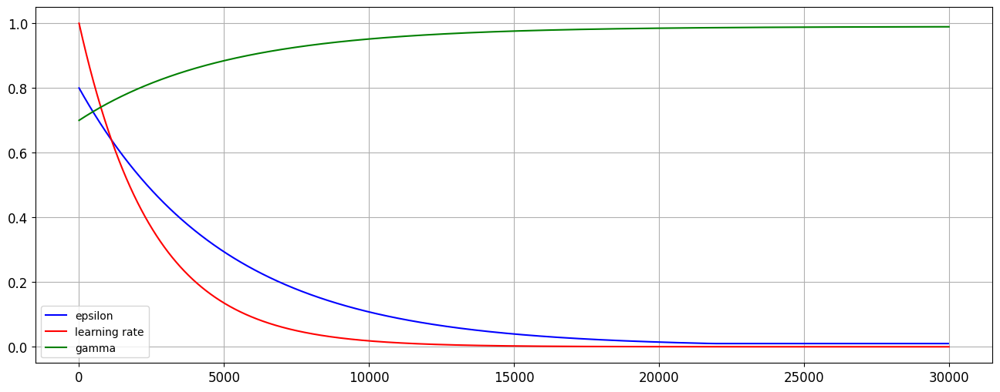

In [106]:
# Run the training with the given hyperparameters
qtable = QTable() #
# Epsilon regulator
eps_decay = 0.999
eps_interval = 25
eps_init = 0.8
epsilon = EpsilonRegulator(epsilon=eps_init, decay=eps_decay, interval=eps_interval)
# Learning rate regulator
lr_decay = 0.9996
lr_interval = 1
lr_init = 1
learning_rate = LearningRateRegulator(learning_rate=lr_init, decay=lr_decay, interval=lr_interval)
# Gamma regulator
g_rate = 1+2e-4
g_interval = 1
g_init = 0.7
g_max = 0.99
gamma = GammaRegulator(gamma=g_init, rate=g_rate,max_gamma=g_max, interval=g_interval)

policy = RandomGreedyPolicy(epsilon=epsilon, qtable=qtable)

EPISODES = 30000
fig, ax = plt.subplots(figsize=(16, 6))
ax.grid()
N = EPISODES
x,y = epsilon.evolution(stop=N)
final_epsilon = y[-1]
ax.plot(x,y, "b", label="epsilon")
x,y = learning_rate.evolution(stop=N)
final_lr = y[-1]
ax.plot(x,y, "r", label="learning rate")
x,y = gamma.evolution(stop=N)
final_gamma = y[-1]
ax.plot(x,y, "g", label="gamma")
ax.legend()
print(f"Final epsilon = {eps_init:.2f}->{final_epsilon:.2e}")
print(f"  -   learning rate = {lr_init:.2f}->{final_lr:.2e}")
print(f"  -   gamma = {g_init:.2f}->{final_gamma:.2e}")

QTable: 20736 states, 2 actions


Episode 29500 - Reward/Episode: 211.0, Policy: RandomGreedyPolicy(epsilon=EpsilonRegulator(1.000e-02)), Gamma: GammaRegulator(9.893e-01), Learning Rate: LearningRateRegulator(1.000e-05): 100%|██████████| 30000/30000 [01:53<00:00, 265.03Episodes/s] 


Portion of Q-Table explored = 1.41%
Last 100 episodes average reward = 247.3


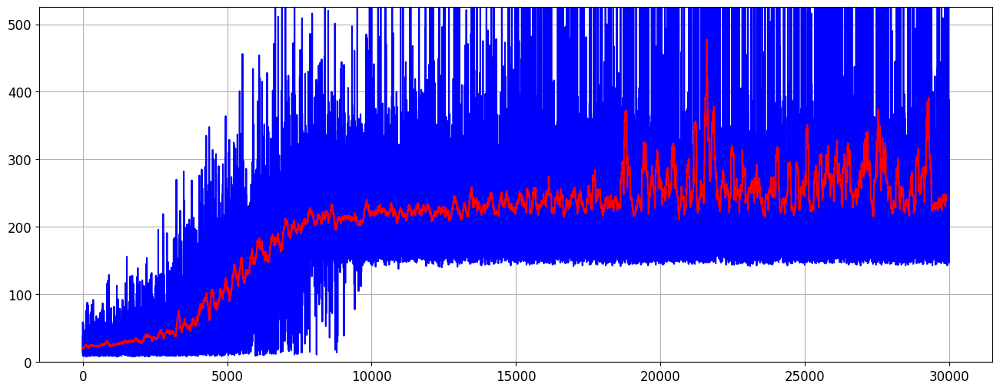

In [107]:
history, qtable = train(env,
                        episodes=EPISODES,
                        gamma=gamma,
                        learning_rate=learning_rate,
                        discrete_steps=DISCRETE_STEPS,
                        qtable=qtable,
                        policy=policy)

## Show animations

In [38]:
def run_simulation(model:Union[QTable,Model], max_steps:int=100000,seed=42, save_frames:bool=False, num_episodes:int=1):
    """ Run a simulation with the current qtable
    """
    seed = seed if seed is not None else np.random.randint(0, 1000)
    simulation_results = {
        "history": [],
        "frames": [],
        "steps": [],
        "average_reward": 0.0,
        "average_steps": 0.0,
    }
    for episode in range(num_episodes):
        frames = [] if save_frames else None
        observation, *_ = env.reset(seed=seed+episode) # reset environment to beginning, new seed each episode
        state = make_state(observation)
        history = initialize_history(max_steps)
        terminate = False
        step = 0
        while not terminate and step<max_steps:
            # From the state find an action
            qvalues = qtable[state]
            action = argmax(qvalues) # greedy action
            # Perform an action to the environment
            next_state, reward, terminate, *_ = env.step(action)
            state = make_state(next_state)
            history[ACTIONS_KEY][step] = action
            history[STATES_KEY][step,:] = state
            history[REWARD_KEY][step] = reward
            if save_frames:
                img = env.render()
                frames.append(img)
            if terminate:
                break
            step += 1
        simulation_results["history"].append(history)
        simulation_results["frames"].append(frames)
        simulation_results["steps"].append(step)
        simulation_results["average_reward"] += history[REWARD_KEY].sum()
        simulation_results["average_steps"] += step
    simulation_results["average_reward"] /= num_episodes
    simulation_results["average_steps"] /= num_episodes
    return simulation_results
def display_simulation_results(simulation_results:dict):
    """ Display the results from a simulation
    """
    mean = simulation_results["average_steps"]
    median = np.median(simulation_results["steps"])
    print(f"Average steps = {mean:.1f}")
    print(f"Median steps = {median:.1f}")
    print(f"Max steps = {max(simulation_results['steps']):.1f}")
    print(f"Min steps = {min(simulation_results['steps']):.1f}")
    fig, axs = plt.subplots(1,2,figsize=(16, 6))
    # Normalized histogram of the number of steps
    density, bin_edges = np.histogram(simulation_results['steps'], bins=int(np.sqrt(len(simulation_results['steps']))), density=True)

    # Calculate bin widths
    bin_widths = bin_edges[1:] - bin_edges[:-1] # [1:] are the right edges, [:-1] are the left edges, the difference is the width per bin

    # The probability can be calculated as the width of the bin times its density
    probabilities = density * bin_widths

    # Plot histogram
    axs[0].bar(bin_edges[:-1], probabilities, width=bin_widths,edgecolor='black', linewidth=1.2, color='lightskyblue', alpha=0.8)
    axs[0].set_xlabel("Number of steps")
    axs[0].set_ylabel("Probability")
    axs[0].grid()
    axs[0].set_title("Histogram of number of steps per episode")
    
    bx = axs[1].boxplot(simulation_results['steps'], vert=False, showmeans=True, patch_artist=True, boxprops=dict(facecolor="lightskyblue", alpha=0.8),showfliers=False)
    axs[1].set_xlabel("Number of steps")
    axs[1].grid()
    axs[1].set_title("Boxplot of number of steps per episode")
    axs[1].set_yticklabels([])
    axs[1].legend([bx["means"][0], bx["medians"][0]], [f"Mean: {mean:.1f}",f"Median: {median:.1f}"])
    plt.show()


### Repeated testing on different initializations of the environment with the final Q-table

Average steps = 449.9
Median steps = 456.5
Max steps = 829.0
Min steps = 149.0


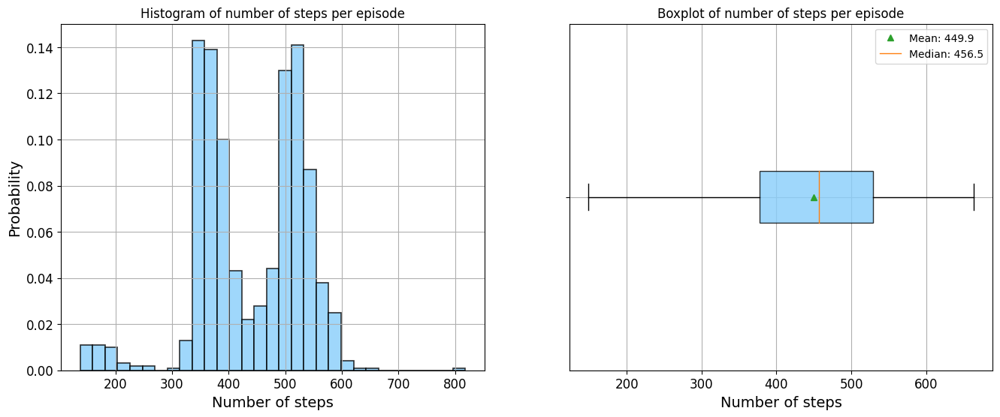

In [39]:
simulation_results = run_simulation(qtable, seed=1024, save_frames=False, num_episodes=1000)
display_simulation_results(simulation_results)

In [19]:
# Note that if the model is bad the animation quickly ends as pole gets out of bounds
# if WithAnimations:
if WithAnimations:
    simulation_results = run_simulation(qtable, seed=50,save_frames=True)
    frames = simulation_results["frames"][0]
    plot_animation(frames)

Once 
 
 Loop 
 
 Reflect

# Analys...
Prova ett antal parameterinställningar och försök få stabil och bra prestanda. Misströsta inte om resultatet verkar dåligt, det är väldigt knepigt att få bra resultat!

## Resultat
Jag implementerade en regressiv explorationsfaktor, se `EpsilonRegulator` ovan, med hjälp av denna metod minskar andelen slumpmässiga (explorativa) val gjorda med hjälp av `RandomGreedyPolicy`. Intuitivt leder detta till att man i början av träningen utforskar en större andel val än i slutet av träningen. Tanken med detta är att agenten ska utforska mer i början av träningen för att sedan fokusera på att förfina den valda processen. För mina bästa resultat använde jag en `RandomGreedyPoliy` med en `EpsilonRegulator`.
#### `EpsilonRegulator`
| Parameter | Beskrivning |
| --- | --- |
| `epsilon` | Den initiala explorationsfaktorn |
| `interval` | Hur många episoder mellan varje minskning av explorationsfaktorn |
| `decay` | Hur mycket explorationsfaktorn ska minska per intervall |

In [1]:
# Plot the results from a training run
episode_reward = history[REWARD_KEY]
fig, ax = plt.subplots(figsize=(16, 6))
ax.grid()
ax.plot(episode_reward, "b")
y_av = running_mean(episode_reward, N=100)
ax.plot(y_av,"r")
ax.set_ylim(0, 750)


NameError: name 'history' is not defined

# Fortsatt analys
För att bättre förstå, de troligen mediokra resultaten, ska du även undersöka Q-tabellen efter träningen. Hur mycket av “världen” har systemet utforskat? Vad säger detta om Q-learning som metod och kan du komma på något som skulle förbättra systemets prestanda och stabilitet.

Med en anpassning av epsilon och inlärningshastighet över tid (börja högt för att möjliggöra mer utforskning och inlärning till en början och sedan senare minska värdet för att stabilisera) kan förbättra prestandan avsevärt. Se Geron Kapitel 18 "exploration policies". Implementera detta (är kanske 4-5 rader kod!) för att se om det hjälper, men se till att jämföra med fallet då dessa parametrar är oföränderliga.


Qtable shape = (20736, 2)
Qtable min = 0.00, max = 9.94


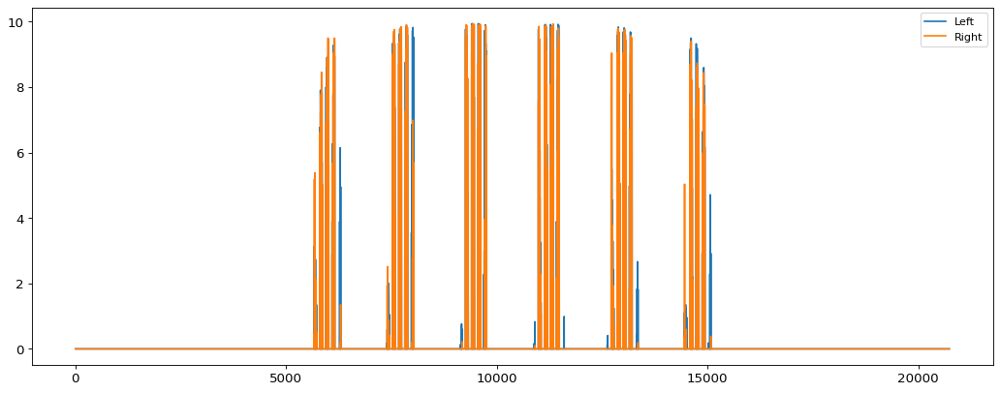

In [ ]:
qtable = np.array(qtable)
print(f"Qtable shape = {qtable.shape}")
print(f"Qtable min = {qtable.min():.2f}, max = {qtable.max():.2f}")
plt.figure(figsize=(16, 6), dpi=80)
plt.plot(qtable[:,0], label='Left')
plt.plot(qtable[:,1], label='Right')
plt.legend()

Grid shape = (2, 144, 144)


Text(0.5, 0, 'Q-Value')

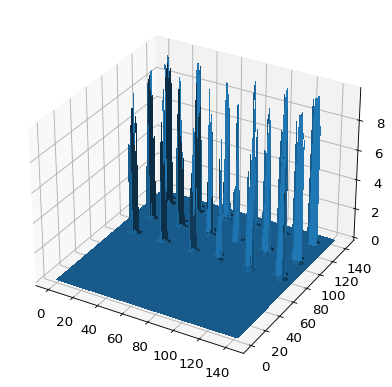

In [ ]:
grid = qtable.reshape(2, DISCRETE_STEPS**2, DISCRETE_STEPS**2)
print(f"Grid shape = {grid.shape}")
# Plot 3D surface
fig = plt.figure(figsize=(16, 6), dpi=80)
ax = fig.add_subplot(111, projection='3d')
x = np.arange(DISCRETE_STEPS**2)
y = np.arange(DISCRETE_STEPS**2)
X, Y = np.meshgrid(x, y)
ax.plot_surface(X, Y, grid[0,:,:], linewidth=0, antialiased=False)
ax.set_zlabel('Q-Value')

In [ ]:
portion_explored = qtable[qtable>0].sum() / qtable.size
print(f"Portion of Q-Table explored = {portion_explored:.2%}")

Portion of Q-Table explored = 11.28%


In [ ]:
qtable.size

41472